# **XAI Project - Explaining Sentiment Analysis of Yelp Reviews**
*Cosimo Palma - Muhammad Imran - Muhammad Waheed Sabir*

Installing and importing all necessary packages for Data - Preprocessing, Training and Explanation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')  #Importing "drive" to use document stored in cloud

Mounted at /content/drive


Lime, Shap and Eli5 are the chosen explanations algorithms

In [ ]:
!pip install eli5

     |████████████████████████████████| 106 kB 7.0 MB/s 


In [ ]:
!pip install lime  #XAI module

     |████████████████████████████████| 275 kB 8.8 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=6eca28bd690a8f1c89133c021bf82e7d3845829e5a6f788063b8f88f72467bd1
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
!pip install shap   #XAI module

     |████████████████████████████████| 564 kB 7.6 MB/s 


In [ ]:
!pip install aix360

In [ ]:
!pip install wordcloud #Word cloud

In [ ]:
!pip install pyspellchecker #Spell Checker

     |████████████████████████████████| 2.7 MB 9.0 MB/s 


In [ ]:
import re    #regular expressions 
import string  # basic string manipulation
import csv      # basic csv manipulation
import pandas as pd #data analysis
import numpy as np #mathematical operations
import matplotlib.pyplot as plt #information visualization
import seaborn as sns #enhanced information visualization
from wordcloud import WordCloud, STOPWORDS #word cloud visualization
from nltk.tokenize import word_tokenize  #NLP library
import random
import nltk
import os
nltk.download('punkt')
nltk.download('wordnet')
from nltk import FreqDist
%matplotlib inline   
#With this backend, the output of plotting commands is displayed inline within frontends like the Colab notebook, 
#directly below the code cell that produced it. The resulting plots will then also be stored in the notebook document.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


# Exploratory Data Analysis

### Load the dataset

The following we are loading the chosen dataset "**Yelp Reviews**" for our project.

In [ ]:
file = open('/content/drive/My Drive/XAI/yelp_review.csv', 'rb')
df = pd.read_csv(file)

### Check the size/shape of dataset

The following code shows the total number of rows and columns in our dataset.

In [ ]:
df.shape

(10000, 10)

### Multi-class to Binary-class Conversion

For the sake of simplicity and better interpretability we are converting the multi-class sentiments to the binary class sentiments (positive sentiments, negative sentiments) in our data. With this procedure we create the additional array "Sentiment", a boolean semplification of the values displayed in "Label", in our case corresponding to 1 for labels values superior to 3. 

In [ ]:
# Dataset splitting into train & test subsets along with numeric class labels
count =  0 
#for train data
fsc_stars= []
fsc_review= []
fsc_sentiment= []
#for test data
fsc_stars_test=[]
fsc_review_test=[]
fsc_sentiment_test= []

for index, row in df.iterrows():
  count += 1 
  fsc_stars.append(row["stars"])
  fsc_review.append(row["text"])
  if int(row["stars"]) < 4:   
    fsc_sentiment.append("0")
  else:
    fsc_sentiment.append("1")
  if count > 8000 :      #for testing we just choose the first 1500 records 
    break 

for index, row in df.iterrows():
  count += 1 
  fsc_stars_test.append(row['stars'])
  fsc_review_test.append(row['text'])
  if int(row["stars"]) < 4:  
    fsc_sentiment_test.append("0")
  else:
    fsc_sentiment_test.append("1")
  if count > 10000:
    break

print(fsc_stars)
print(fsc_sentiment)

[5, 5, 4, 5, 5, 4, 5, 4, 4, 5, 5, 5, 5, 4, 4, 2, 3, 5, 3, 4, 3, 5, 5, 1, 5, 4, 5, 4, 4, 4, 5, 1, 5, 4, 3, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 5, 3, 4, 4, 4, 5, 4, 4, 5, 4, 2, 4, 4, 5, 4, 1, 3, 4, 1, 1, 5, 5, 4, 5, 4, 1, 4, 4, 5, 4, 4, 4, 5, 1, 4, 4, 5, 4, 1, 4, 5, 4, 5, 1, 1, 5, 4, 4, 4, 5, 4, 4, 5, 5, 4, 5, 5, 4, 3, 1, 5, 3, 5, 4, 2, 5, 5, 1, 3, 4, 3, 3, 4, 1, 4, 5, 5, 4, 5, 5, 1, 5, 3, 2, 3, 3, 4, 4, 5, 3, 1, 2, 5, 4, 1, 4, 4, 3, 5, 5, 3, 2, 1, 5, 3, 4, 5, 3, 5, 5, 3, 5, 5, 2, 5, 5, 2, 2, 5, 1, 5, 3, 4, 4, 1, 3, 2, 3, 4, 4, 5, 5, 5, 3, 5, 3, 5, 5, 5, 5, 4, 4, 5, 5, 1, 4, 4, 5, 3, 4, 2, 3, 4, 5, 5, 5, 5, 4, 4, 5, 5, 4, 1, 4, 3, 3, 1, 5, 4, 5, 4, 5, 2, 4, 4, 3, 5, 3, 4, 2, 5, 5, 5, 5, 4, 4, 2, 3, 1, 2, 4, 2, 5, 1, 3, 5, 4, 2, 5, 4, 4, 4, 4, 3, 3, 5, 2, 5, 5, 4, 4, 2, 5, 5, 5, 4, 5, 4, 5, 4, 5, 3, 3, 4, 5, 4, 4, 3, 4, 3, 5, 4, 5, 5, 3, 1, 3, 2, 5, 5, 3, 1, 3, 1, 3, 2, 1, 5, 4, 5, 4, 4, 5, 1, 4, 3, 4, 4, 4, 4, 3, 5, 2, 3, 4, 5, 4, 3, 4, 4, 5, 2, 3, 3, 4, 1, 3, 2, 5, 4, 4, 4, 3, 3, 3, 5, 2, 

To better rearrange our dataset we use the pandas function "Dataframe". The "sentiment" array is added as a column

In [ ]:
d_train = pd.DataFrame(data={'content': fsc_review, 'label': fsc_stars, 'sentiment': fsc_sentiment })
d_test = pd.DataFrame(data={'content': fsc_review_test, 'label': fsc_stars_test, 'sentiment': fsc_sentiment_test})
print(d_train)
print(d_test)


                                                content  label sentiment
0     My wife took me here on my birthday for breakf...      5         1
1     I have no idea why some people give bad review...      5         1
2     love the gyro plate. Rice is so good and I als...      4         1
3     Rosie, Dakota, and I LOVE Chaparral Dog Park!!...      5         1
4     General Manager Scott Petello is a good egg!!!...      5         1
...                                                 ...    ...       ...
7996  Upscale restaurant on-site at the Wigwam. The ...      4         1
7997  Cozy, cute and yes, a little claustraphobic......      4         1
7998  If we hadn't arrived after a tiring day and pr...      1         0
7999  WOW.  This places is incredible.  I can honest...      5         1
8000  Still a place that is unacceptable in my book-...      1         0

[8001 rows x 3 columns]
                                                content  label sentiment
0     My wife took me here

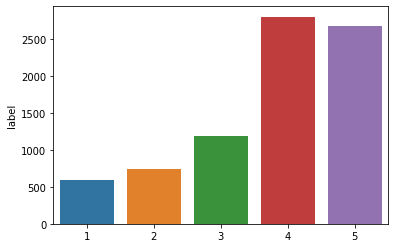

In [ ]:
plot = sns.barplot(y = d_train.label.value_counts(), x = d_train.label.value_counts().index)

Even after ranking the 3-stars review as negative our dataset results unbalanced. In the following we are therefore recurring to other techniques to achieve the balance.

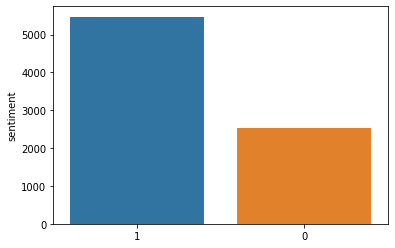

In [ ]:
plot = sns.barplot(y = d_train.sentiment.value_counts(), x = d_train.sentiment.value_counts().index)

# **Random over- and undersampling**

Considering that the positive class instances are more than the double more than the negative ones, we decided to apply both random undersampling and oversampling: using only the first approach would have shrunk our dataset eccessively, hence reduced the recall of the training fit as well. Using only the second approach would have practically meant to double the weight of all words classified as negative. As can be noticed from the wordclouds in the following paragraph, there are many words that are classified as both positive and negative. Using random oversampling exclusively would inevitably and uncorrectly switch the classification of some positive words to negative. For these reasons the chosen heuristics is to re-add to the dataset the half of negative reviews and to delete from it approximately three tenths of the positive ones. 

In [ ]:
# Dataset splitting into train & test subsets along with numeric class labels
count =  0
#for train data
fsc_stars= []
fsc_review= []
fsc_sentiment= []
#for test data
fsc_stars_test=[]
fsc_review_test=[]
fsc_sentiment_test= []

def decision(probability):
  return random.random() < probability

for index, row in df.iterrows():
  if int(row["stars"]) < 4:   # replaced '3' with '4' to explore first changes in dataset balancement
    fsc_stars.append(row["stars"])
    fsc_review.append(row["text"])
    fsc_sentiment.append("0")
    if random.choice([0,1]) == 1:  #randomly double the just reached value (p=0.5)
      fsc_stars.append(row["stars"])
      fsc_review.append(row["text"])
      fsc_sentiment.append("0")
  else:
    if decision(0.7):
      fsc_stars.append(row["stars"])
      fsc_review.append(row["text"])
      fsc_sentiment.append("1")  #only 7/10 of the positively classified reviews will be added to the dataset  
  count += 1
  if count > 8000 :      #for testing we just choose the first 1500 records 
    break 

for index, row in df.iterrows():
  if int(row["stars"]) < 4:  # replaced '3' with '4' to explore first changes in dataset balancement
    fsc_stars_test.append(row['stars'])
    fsc_review_test.append(row['text'])
    fsc_sentiment_test.append("0")
    if random.choice([0,1])==1:  #randomly double the just reached value (p=0.5)
      fsc_stars_test.append(row["stars"])
      fsc_review_test.append(row["text"])
      fsc_sentiment_test.append("0")
  else:
    if decision(0.7):
      fsc_stars_test.append(row['stars'])
      fsc_review_test.append(row['text'])
      fsc_sentiment_test.append("1")          
  count += 1
  if count > 10000:
    break
      
print(fsc_stars_test)
print(fsc_sentiment_test)

[5, 5, 4, 5, 5, 5, 4, 5, 5, 5, 5, 4, 4, 2, 3, 3, 5, 3, 3, 4, 3, 3, 5, 1, 1, 4, 5, 4, 4, 5, 1, 1, 3, 3, 1, 4, 4, 4, 4, 4, 4, 4, 4, 3, 5, 3, 3, 4, 4, 5, 4, 5, 2, 2, 4, 4, 1, 1, 3, 3, 4, 1, 1, 1, 5, 4, 4, 1, 4, 4, 5, 4, 4, 5, 1, 1, 4, 4, 4, 1, 1, 4, 5, 1, 1, 5, 4, 4, 4, 4, 5, 4, 5, 5, 4, 3, 3, 1, 1, 5, 3, 3, 4, 2, 2, 5, 1, 3, 3, 4, 3, 3, 4, 1, 1, 4, 5, 4, 5, 1, 1, 3, 2, 3, 3, 3, 3, 4, 4, 5, 3, 1, 2, 2, 5, 1, 3, 3, 5, 5, 3, 2, 2, 1, 5, 3, 4, 5, 3, 3, 5, 5, 3, 5, 5, 2, 5, 5, 2, 2, 2, 5, 1, 5, 3, 1, 3, 2, 3, 3, 4, 4, 5, 5, 3, 5, 3, 3, 5, 5, 4, 5, 1, 4, 4, 5, 3, 3, 4, 2, 3, 4, 5, 5, 5, 5, 4, 4, 5, 5, 1, 4, 3, 3, 1, 1, 5, 4, 4, 5, 2, 4, 4, 3, 3, 3, 2, 2, 5, 5, 5, 4, 4, 2, 2, 3, 1, 2, 4, 2, 1, 1, 3, 5, 2, 5, 4, 4, 4, 3, 3, 3, 2, 5, 4, 2, 5, 5, 5, 4, 5, 4, 5, 3, 3, 3, 4, 5, 4, 4, 3, 4, 3, 3, 5, 4, 5, 3, 3, 1, 1, 3, 2, 5, 5, 3, 1, 3, 1, 1, 3, 2, 1, 1, 5, 4, 4, 4, 5, 1, 1, 4, 3, 3, 4, 4, 4, 4, 3, 3, 5, 2, 2, 3, 4, 5, 4, 3, 4, 4, 5, 2, 2, 3, 3, 3, 1, 3, 3, 2, 4, 4, 3, 3, 3, 3, 2, 5, 5, 4, 4, 1, 1, 

In [ ]:
d_train = pd.DataFrame(data={'content': fsc_review, 'label': fsc_stars, 'sentiment': fsc_sentiment })
d_test = pd.DataFrame(data={'content': fsc_review_test, 'label': fsc_stars_test, 'sentiment': fsc_sentiment_test})
print(d_train)
print(d_test)
#print(len(d_train['label']))

                                                content  label sentiment
0     My wife took me here on my birthday for breakf...      5         1
1     love the gyro plate. Rice is so good and I als...      4         1
2     Rosie, Dakota, and I LOVE Chaparral Dog Park!!...      5         1
3     General Manager Scott Petello is a good egg!!!...      5         1
4     Luckily, I didn't have to travel far to make m...      4         1
...                                                 ...    ...       ...
7621  Upscale restaurant on-site at the Wigwam. The ...      4         1
7622  Cozy, cute and yes, a little claustraphobic......      4         1
7623  If we hadn't arrived after a tiring day and pr...      1         0
7624  Still a place that is unacceptable in my book-...      1         0
7625  Still a place that is unacceptable in my book-...      1         0

[7626 rows x 3 columns]
                                                content  label sentiment
0     My wife took me here

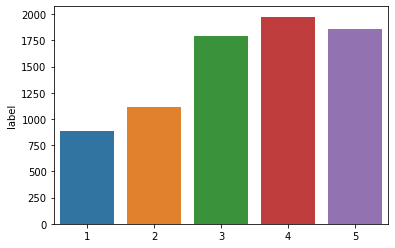

In [ ]:
plot = sns.barplot(y = d_train.label.value_counts(), x = d_train.label.value_counts().index)

From the following representation we can assess that the adopted strategy has delivered the expected results

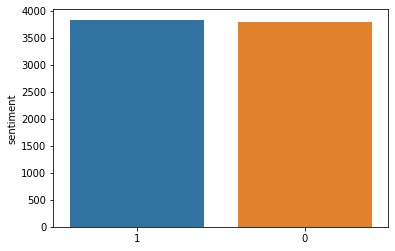

In [ ]:
plot = sns.barplot(y = d_train.sentiment.value_counts(), x = d_train.sentiment.value_counts().index)

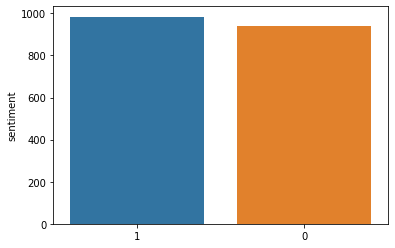

In [ ]:
plot = sns.barplot(y = d_test.sentiment.value_counts(), x = d_test.sentiment.value_counts().index)

# Data Cleaning

### Check for missing values (empty strings)

In this section we are checking missing values using the isna() built in function and displaying the sum of missing values by the field.

In [ ]:
d_train.isna().sum()

content      0
label        0
sentiment    0
dtype: int64

Sometime the there are text strings containing a single space only which are not detected with the isan() function. So in the following code we are detecting and filtering the empty strings using some custome code as well.

In [ ]:
d_train[ (d_train['content'].isnull()) | (d_train['content'].str.len() == 0) ]

,content,label,sentiment


We don't have any missings or empty values as shown above in the missing values analysis, so no need to remove or impute the missing values.

### Lemmatization
By this operation words are brought to their basic form 
(Lancaster/PorterStemmer, WordnetLemmatizer)

In [ ]:
from nltk.stem import PorterStemmer #or "PorterStemmer"
from nltk.stem import WordNetLemmatizer 

text = "the girls were obsessed by the games"


def lemmatize(text):
  # Init the Wordnet Lemmatizer
  output = []
  lemmatizer = WordNetLemmatizer()
  text = text.lower()
  word_list = word_tokenize(text)
  for word in word_list:
    word = lemmatizer.lemmatize(word)
    output.append(word)
  output = ' '.join(output)
  return output

def stemmer(text):
  output = []
  ps =PorterStemmer()
  word_list = word_tokenize(text)
  for w in word_list:
    rootWord=ps.stem(w)
    output.append(rootWord)
    output = ' '.join(output)
  return output


lemmatize(text)
#stemmer(text)


'the girl were obsessed by the game'

### Remove Newlines (\n) from the text

The following script removes trailing lines (beofre & end) from the text data.

In [ ]:
def remove_newline (text):
    return text.strip()

d_train['content'] = d_train['content'].apply(lambda x : remove_newline(x))

### Removing URLs

The following script removes any URLs from the text data.

In [ ]:
def remove_URL (text):
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', text, flags=re.MULTILINE)
    return(text)
d_train['content'] = d_train['content'].apply(lambda x : remove_URL(x))

### Removing HTML tags

The following script removes any HTML tags from the text data.

In [ ]:
def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
d_train['content']=d_train['content'].apply(lambda x : remove_html(x))

### Removing Emojis

The following script removes the emojis from the text data.

In [ ]:
def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

d_train['content']=d_train['content'].apply(lambda x: remove_emoji(x))

### Removing Punctuations

The following code removes the punctuations from the text data.

In [ ]:
# Remove Punctionations from the text
def remove_punctuation(text):
  text =  word_tokenize(text)
  for word in text:
    for punkt in list(string.punctuation):
        word = word.replace(punkt, '')
  text = ' '.join(text)
  return text    

### Removing Stopwords and Low Frequency Words

The following code removes the stopwords and low frequency words from the text data.

In [ ]:
from sklearn.feature_extraction import text

stop_words = text.ENGLISH_STOP_WORDS
#print(stop_words)
stop_words = list(STOPWORDS)
# Remove Stop Words form the text
def cleansing(text):
    text = text.lower()
    word_list = word_tokenize(text)
    word_list = [word for word in word_list if len(word) > 2] #words shorter than three characters are excluded from the dataset
    #word_list = [remove_punctuation(word) for word in word_list]  #punctuation is removed
    text = ' '.join(word_list)
    fdist = FreqDist(text)
    hi_freq = list(filter(lambda x: x[1]>10000,fdist.items()))  
    text = [w for w in word_list if not w in stop_words and not w in hi_freq]  #high frequency (more than 5000 occurrencies) words are removed
    text = ' '.join(text)
    return text

### Spelling Correction

In this section, we are finding and correction possible spellings mistakes in the reviews text data.

In [ ]:
from spellchecker import SpellChecker
text = "I wantd too amaziiing hallo"

def correct_spellings(text):
  spell = SpellChecker()
  corrected_text = []
  misspelled_words = spell.unknown(word_tokenize(text))
  for word in word_tokenize(text):
      corrected_text.append(spell.correction(word))
  return " ".join(corrected_text)

#correct_spellings(text)

In order to yield a more accurate training, data must be cleaned and preprocessed appropriately. Therefore all elements which do not bear meaningful sentiment values (Punctuation, Stopwords, as well as low frequency words, newlines, URLs, HTML tags and) are removed from the reviews text.

In [ ]:
d_train['content_cleansing'] = d_train.content.apply(cleansing)
d_train['content_cleansing'] = d_train['content_cleansing'].apply(lemmatize)
d_train['content_cleansing'] = d_train['content_cleansing'].apply(remove_punctuation)
#d_train['content_cleansing'] = d_train['content_cleansing'].apply(lambda x : correct_spellings(x))
d_test['content_cleansing'] = d_test.content.apply(cleansing)
d_test['content_cleansing'] = d_test['content_cleansing'].apply(lemmatize)
d_test['content_cleansing'] = d_test['content_cleansing'].apply(remove_punctuation)
print(d_train['content_cleansing'])
print(d_train['content'])

0       wife took birthday breakfast excellent weather...
1       idea people give bad review place go show plea...
2           love gyro plate rice good dig candy selection
3       rosie dakota love chaparral dog park convenien...
4       general manager scott petello good egg detail ...
                              ...                        
7554    place pure crap player sub-par un-entertaining...
7555    superb beer selection music really nice good v...
7556    n't arrived tiring day prepaid online checked ...
7557    wow place incredible honestly say everything m...
7558    still place unacceptable book especially serve...
Name: content_cleansing, Length: 7559, dtype: object
0       My wife took me here on my birthday for breakf...
1       I have no idea why some people give bad review...
2       love the gyro plate. Rice is so good and I als...
3       Rosie, Dakota, and I LOVE Chaparral Dog Park!!...
4       General Manager Scott Petello is a good egg!!!...
                   

### Count characters and words in review strings

The following code counts the number of characters and number of words in each textual entry (review) and stores them in as a new filed in the dataframe.

In [ ]:
d_train['characters_count']=d_train.content_cleansing.apply(lambda x: len(x))
d_train['words_count']=d_train.content_cleansing.apply(lambda x: len(x.split()))

# Calcuate average of the length of revies
d_train_averages = d_train.groupby('sentiment').mean()

d_train

,content,label,sentiment,content_cleansing,characters_count,words_count
0,My wife took me here on my birthday for breakf...,5,1,wife took birthday breakfast excellent weather...,525,73
1,love the gyro plate. Rice is so good and I als...,4,1,love gyro plate rice good dig candy selection,45,8
2,"Rosie, Dakota, and I LOVE Chaparral Dog Park!!...",5,1,rosie dakota love chaparral dog park convenien...,272,43
3,General Manager Scott Petello is a good egg!!!...,5,1,general manager scott petello good egg detail ...,265,42
4,"Luckily, I didn't have to travel far to make m...",4,1,luckily n't travel far make connecting flight ...,165,24
...,...,...,...,...,...,...
7621,Upscale restaurant on-site at the Wigwam. The ...,4,1,upscale restaurant on-site wigwam hotel locati...,169,23
7622,"Cozy, cute and yes, a little claustraphobic......",4,1,cozy cute yes little claustraphobic ... corona...,1539,228
7623,If we hadn't arrived after a tiring day and pr...,1,0,n't arrived tiring day prepaid online checked ...,305,47
7624,Still a place that is unacceptable in my book-...,1,0,still place unacceptable book especially serve...,178,26


### Average length in characters over reviews

The following bar graph shows the average lenght of characters in the reviews under individual sentiments (positive, negative) in the dataset. On the x-axis sentiments are listed and on the y-axis shows the average number of characters in the reviews of a particular sentiment.

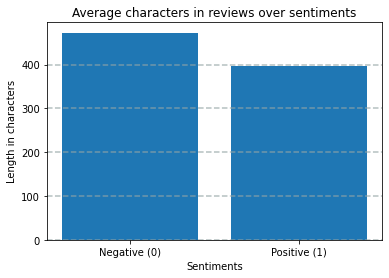

In [ ]:
data = d_train_averages['characters_count']
#labels = d_train_averages.sentiment
labels = ['Negative (0)', 'Positive (1)']

plt.xticks(range(len(data)), labels)
plt.xlabel('Sentiments')
plt.ylabel('Length in characters')
plt.title('Average characters in reviews over sentiments')
plt.bar(range(len(data)), data)
plt.grid(color='#95a5a6', linestyle='--', linewidth=1.5, axis='y', alpha=0.7) 
plt.show()

### Average words in reviews

The following bar graph shows the average number of words in the reviews under individual sentiments (positive, negative) in the dataset. On the x-axis sentiments are listed and on the y-axis shows the average number of words in the reviews of a particular sentiment.

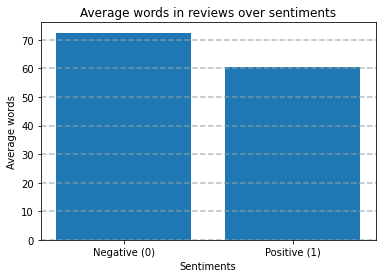

In [ ]:
data = d_train_averages['words_count']
#labels = df_newsgroups.topic
labels = ['Negative (0)', 'Positive (1)']

plt.xticks(range(len(data)), labels)
plt.xlabel('Sentiments')
plt.ylabel('Average words')
plt.title('Average words in reviews over sentiments')
plt.bar(range(len(data)), data)
plt.grid(color='#95a5a6', linestyle='--', linewidth=1.5, axis='y', alpha=0.7) 
plt.show()

# **Update training and validation datasets**

In [ ]:
texts_train = d_train['content_cleansing'].values
texts_test = d_test['content'].values
texts_test2 = d_test['content_cleansing'].values
yy_train = pd.to_numeric(d_train['sentiment']).values
yy_test =  pd.to_numeric(d_test['sentiment']).values
print(texts_train)
print(texts_test.shape)
print(yy_train)
print(yy_test.shape)

["wife took birthday breakfast excellent weather perfect made sitting outside overlooking ground absolute pleasure waitress excellent food arrived quickly semi-busy saturday morning looked place fill pretty quickly earlier better favor bloody mary phenomenal simply best 've pretty sure use ingredient garden blend fresh order amazing everything menu look excellent white truffle scrambled egg vegetable skillet tasty delicious came piece griddled bread amazing absolutely made meal complete best toast 've anyway n't wait back"
 "idea people give bad review place go show please everyone probably griping something fault ... many people case friend arrived 5:50 past sunday pretty crowded thought sunday evening thought wait forever seat said 'll seated girl come back seating someone seated 5:52 waiter came got drink order everyone pleasant host seated waiter server price good well placed order decided wanted 6:02. shared baked spaghetti calzone small beef pizza try calzone huge got smallest on

#Count Vectors for Dataset

With the sklearn library we use a function (CountVectorizer) to create a type-dictionary of our dataset. Each word will be treated as a feature. This kind of processing is necessary to be able to assign a sentiment to each word. (we opted for the upcoming method: tf-idf)

In [ ]:
"""

from sklearn.feature_extraction.text import CountVectorizer

train = ' '.join([str(elem) for elem in texts_train])
#texttostem = word_tokenize(texttostem)
#train = ' '.join([str(elem) for elem in texttostem])
train = train.split()

count_vectorizer =  CountVectorizer(max_features = 854) #max_features

feature_vector = count_vectorizer.fit(train)

features = feature_vector.get_feature_names_out()

train_ds_features = count_vectorizer.transform(train)

features_counts =  np.sum(train_ds_features.toarray(),axis=0)

features_counts = pd.DataFrame(dict(features = features, counts = features_counts))

#print(len(feature_vector.vocabulary_))

features_counts.sort_values('counts', ascending=False)[0:100]

"""

"\n\nfrom sklearn.feature_extraction.text import CountVectorizer\n\ntrain = ' '.join([str(elem) for elem in texts_train])\n#texttostem = word_tokenize(texttostem)\n#train = ' '.join([str(elem) for elem in texttostem])\ntrain = train.split()\n\ncount_vectorizer =  CountVectorizer(max_features = 854) #max_features\n\nfeature_vector = count_vectorizer.fit(train)\n\nfeatures = feature_vector.get_feature_names_out()\n\ntrain_ds_features = count_vectorizer.transform(train)\n\nfeatures_counts =  np.sum(train_ds_features.toarray(),axis=0)\n\nfeatures_counts = pd.DataFrame(dict(features = features, counts = features_counts))\n\n#print(len(feature_vector.vocabulary_))\n\nfeatures_counts.sort_values('counts', ascending=False)[0:100]\n\n"

# **TF-IDF Vectorizer**

A better solution for the collection´s conversion to a matrix of features is represented by the TF-IDF vectorizer [Term-Frequency (times) Inverse Document-Frequency], which considers overall document weight of a word. Using it we can penalize the most frequent words and highlight the rarest ones. Tfidf-Vectorizer weights the word counts by a measure of how often they appear in each review, so that the text frequency is normalized.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

train = ' '.join([str(elem) for elem in texts_train])
#texttostem = word_tokenize(texttostem)
#train = ' '.join([str(elem) for elem in texttostem])
train = train.split()

tfidf_vectorizer =  TfidfVectorizer(max_features = 854) #max_features = 2000

feature_vector = tfidf_vectorizer.fit(train)

features = feature_vector.get_feature_names_out()

train_ds_features = tfidf_vectorizer.transform(texts_train)

features_counts =  np.sum(train_ds_features.toarray(),axis=0)

features_counts = pd.DataFrame(dict(features = features, counts = features_counts))

print(len(feature_vector.vocabulary_))

features_counts[0:100]
print(train_ds_features.shape)

854
(7626, 854)


# Distribution of words across different sentiments




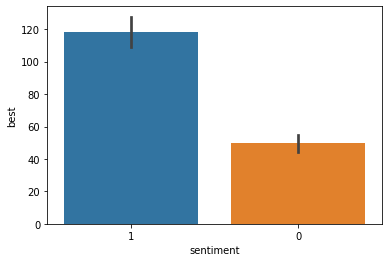

In [ ]:
#train = ' '.join([str(elem) for elem in d_train['content_cleansing']])
train_ds_df = pd.DataFrame(train_ds_features.todense()) 

train_ds_df.columns = features

train_ds_df['sentiment'] = d_train['sentiment']
train_ds_df['label'] = d_train['label']
sns.barplot(x = 'sentiment',y = 'best', data = train_ds_df, estimator= sum)  #the word whose occurrence across the sentiments we would
#like to explore is inserted in the second function´s parameter (y). Here we make the case for "best", which counterintuitively displays a couple of
#negative occurrences as well



Other three examples showing labels instead of sentiments (for them neutral words have been selected)

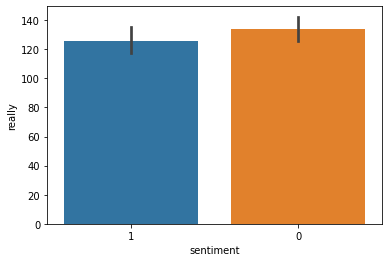

In [ ]:
sns.barplot(x = 'sentiment',y = 'really', data = train_ds_df, estimator= sum)

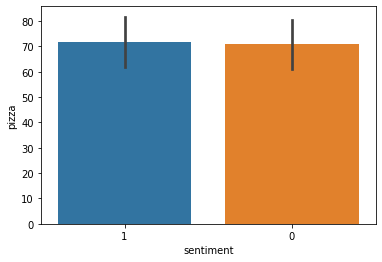

In [ ]:
sns.barplot(x = 'sentiment',y = 'pizza', data = train_ds_df, estimator= sum)

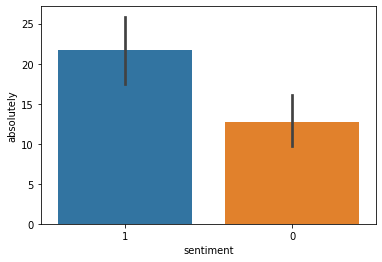

In [ ]:
sns.barplot(x = 'sentiment', y = 'absolutely', data = train_ds_df, estimator= sum)

### Overall Word Cloud

A word cloud is a visual representation of text data, which is frequently used in the Yelp reviews (text entries). The following word cloud shows the most frequent words (top-100) used in the overall dataset accross both positive and negative sentiments.

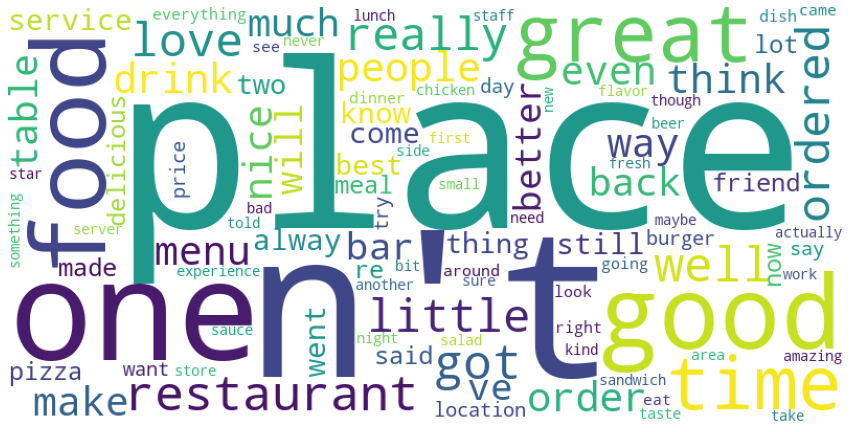

In [ ]:
# Display Word Cloud to analyze frequent words
def display_wordcloud(text):
    wc = WordCloud(width=800,height=400, background_color='white', max_words=100, margin=2).generate(text)
    plt.figure(figsize=(15,8))
    plt.imshow(wc)
    plt.axis("off")
    plt.show()

all_reviews = " ".join([x for x in d_train.content_cleansing])
display_wordcloud(all_reviews)

### Word Cloud - Positive Reviews

The following word cloud shows the most frequent words (top-100) used in the reviews with positive sentiments in the dataset.

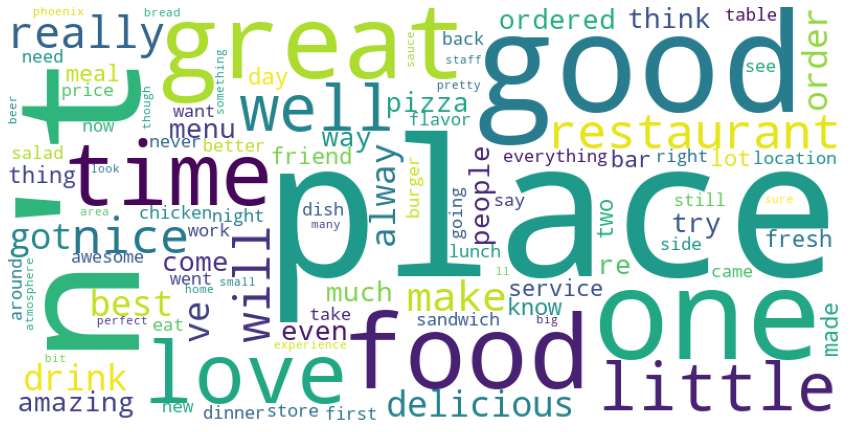

In [ ]:
# Wordcloud with positive reviews
positive_reviews = " ".join([x for x in d_train['content_cleansing'][d_train["sentiment"] == '1']])
display_wordcloud(positive_reviews)

### Word Cloud - Negative Reviews

The following word cloud shows the most frequent words (top-100) used in the reviews with negative sentiments in the dataset.

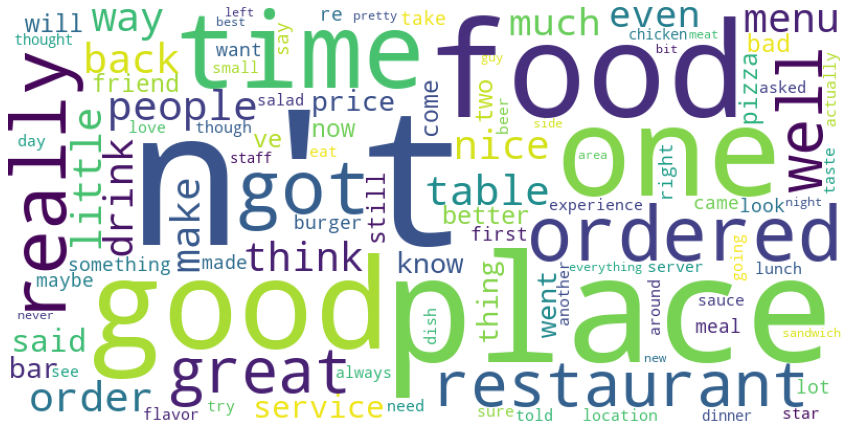

In [ ]:
# Wordcloud with negative reviews
negative_reviews = " ".join([x for x in d_train['content_cleansing'][d_train["sentiment"] == '0']])
display_wordcloud(negative_reviews)

### N-gram Analysis

In this section we will do a bigram (n=2) analysis over the reviews. It shows the most common bigrams in Yelp reviews. In the following section regarding "Word embedding" we will better show how the algorithm can capture also the word´s context while assigning it to a class.

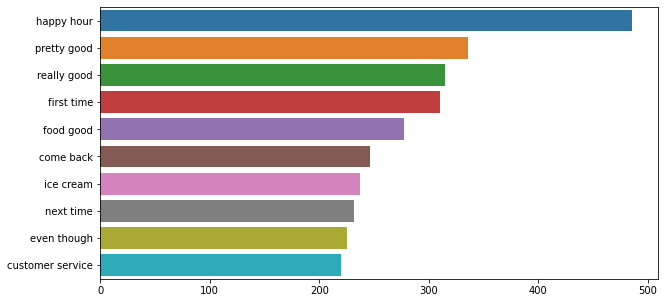

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_reviews_bigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

plt.figure(figsize=(10,5))
top_reviews_bigrams=get_top_reviews_bigrams(d_train['content_cleansing'])[:10]
x,y=map(list,zip(*top_reviews_bigrams))
sns.barplot(x=y,y=x)

## Train-Test Dataset Split

Splitting the transformed dataset into training data and test data in the proportion of 80:20 using the sklearn package train_test_split. The splitting generally takes place at this point: after the preprocessing, before the training phase. Nonetheless, the previous dataset splitting method (and moment) is kept for pedagogical purposes 

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(train_ds_features, yy_train,test_size=0.2,random_state=101)
print(x_train.shape)
print(x_train)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(6100, 854)
  (0, 821)	0.12754666226608485
  (0, 758)	0.13924935654147577
  (0, 726)	0.13627665219778132
  (0, 718)	0.1391932745974532
  (0, 706)	0.16897752247582043
  (0, 668)	0.13293200521033643
  (0, 639)	0.15704348663429618
  (0, 637)	0.11392673264880408
  (0, 605)	0.12820748183332228
  (0, 600)	0.1393338053477301
  (0, 591)	0.12128379891797471
  (0, 584)	0.14364417031391194
  (0, 579)	0.1131090227778652
  (0, 555)	0.14422567707325593
  (0, 533)	0.13856047436566601
  (0, 495)	0.16693373729186592
  (0, 483)	0.15020708669703436
  (0, 456)	0.1664254374219659
  (0, 437)	0.1258846810260235
  (0, 415)	0.13126520499457808
  (0, 381)	0.15567555311697318
  (0, 378)	0.1437517947278943
  (0, 335)	0.1585228478905583
  (0, 315)	0.30340866061831884
  (0, 310)	0.10843473344249882
  :	:
  (6099, 526)	0.28702560804740795
  (6099, 522)	0.13458814118657023
  (6099, 493)	0.13454210001399494
  (6099, 492)	0.09780940862685207
  (6099, 491)	0.2953432233551702
  (6099, 468)	0.12073217457103491
  (6099, 43

# Finally the training process can start. We are exploring  different models, so that the explanation can be performed on the one evaluated as most precise.

# **Multinomial Naive Bayes**

Based on the Bayes formula for conditional probability: P(A|B) = P(A) * P(B|A)/P(B)
Where we are calculating the probability of class A when predictor B is already provided.

P(B) = prior probability of B

P(A) = prior probability of class A

P(B|A) = occurrence of predictor B given class A probability

This formula helps in calculating the probability of the tags in the text.

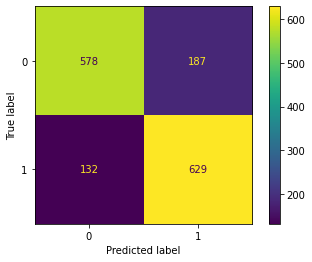



              precision    recall  f1-score   support

           0       0.81      0.76      0.78       765
           1       0.77      0.83      0.80       761

    accuracy                           0.79      1526
   macro avg       0.79      0.79      0.79      1526
weighted avg       0.79      0.79      0.79      1526



0

In [ ]:
#Building the model
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import plot_confusion_matrix

nb = MultinomialNB()
nb.fit(x_train, y_train)

#Testing our model
nb_predict = nb.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
cm = confusion_matrix(y_test, nb_predict, labels=nb.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=nb.classes_)
disp.plot()
plt.show()
print('\n')


#Creating the classification report
print(classification_report(y_test, nb_predict))  ### The model achieved 93% accuracy. 
                                                  ### However, since we know that there are some bias values, 
                                                  ### so let's just test it on a single review.

#positive single review
pos_review = d_train["content_cleansing"][59]
pos_review

pos_review_t = tfidf_vectorizer.transform([pos_review])
nb.predict(pos_review_t)[0]                       ### 5 star rating which is good as expected 


#Negative single review
neg_review = d_train["content_cleansing"][281]
neg_review

neg_review_t = tfidf_vectorizer.transform([neg_review])
nb.predict(neg_review_t)[0]                       ### 1 star rating which is fine as expected

# **K-NN (K-Nearest Neighbour) classifier**

K-NN is a non-parametric algorithm, which means it does not make any assumption on underlying data.
It is also called a lazy learner algorithm because it does not learn from the training set immediately instead it stores the dataset and at the time of classification, it performs an action on the dataset.
KNN algorithm at the training phase just stores the dataset and when it gets new data, then it classifies that data into a category that is much similar to the new data. 

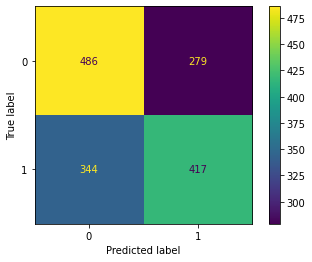



              precision    recall  f1-score   support

           0       0.59      0.64      0.61       765
           1       0.60      0.55      0.57       761

    accuracy                           0.59      1526
   macro avg       0.59      0.59      0.59      1526
weighted avg       0.59      0.59      0.59      1526



In [ ]:
#Building the model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

#Testing our model on x_test
knn_predict = knn.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
cm = confusion_matrix(y_test, knn_predict, labels=knn.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
disp.plot()
plt.show()
print('\n')

#Creating the classification report
print(classification_report(y_test, knn_predict))   

# **Support Vector Machine**

Support Vector Machine (SVM) is a supervised machine learning algorithm that can be used for both classification or regression challenges.In the SVM algorithm, each data item is plotted as a point in n-dimensional space (where n is a number of features you have) with the value of each feature being the value of a particular coordinate. The classification is then performed by finding the hyper-plane that best differentiates the two classes 

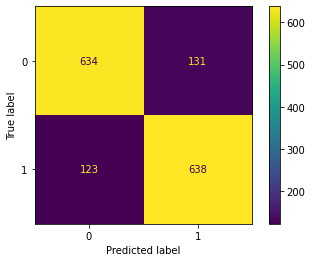



              precision    recall  f1-score   support

           0       0.84      0.83      0.83       765
           1       0.83      0.84      0.83       761

    accuracy                           0.83      1526
   macro avg       0.83      0.83      0.83      1526
weighted avg       0.83      0.83      0.83      1526



In [ ]:
#Building the model
from sklearn.svm import SVC
svm = SVC()
svm.fit(x_train, y_train)

#Testing our model on x_test
svm_predict = svm.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
cm = confusion_matrix(y_test, svm_predict, labels=svm.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm.classes_)
disp.plot()
plt.show()
print('\n')

#Creating the classification report
print(classification_report(y_test, svm_predict))   

# **Random Forest Classifier**

A random forest is a supervised machine learning algorithm that is constructed from decision tree algorithms. The (random forest) algorithm establishes the outcome based on the predictions of the decision trees. It predicts by taking the average or mean of the output from various trees. Increasing the number of trees increases the precision of the outcome.

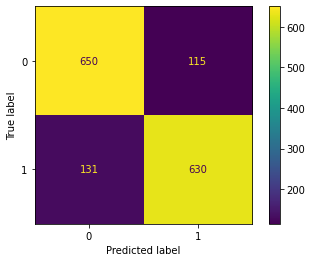



              precision    recall  f1-score   support

           0       0.83      0.85      0.84       765
           1       0.85      0.83      0.84       761

    accuracy                           0.84      1526
   macro avg       0.84      0.84      0.84      1526
weighted avg       0.84      0.84      0.84      1526



In [ ]:
#Building the model
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(x_train, y_train)

#Testing our model on x_test
rf_predict = rf.predict(x_test)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
cm = confusion_matrix(y_test, rf_predict, labels=rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rf.classes_)
disp.plot()
plt.show()
print('\n')

#Creating the classification report
print(classification_report(y_test, rf_predict)) 

# Word Embeddings

This method represents words as dense word vectors (or word embeddings) which are not hardcoded but trained.
Word embeddings map semantic meaning into a geometric space. This geometric space is then called the *embedding space*.
This would map semantically similar words close on the embedding space like numbers or colors (a famous example in this field of study is the ability to map King - Man + Woman = Queen).
There are two options for this. One way is to train our word embeddings during the training of your neural network (see the red outcommented code´s chunk). The other way is by using pretrained word embeddings which we can directly use in your model (the one we have just selected).
Each line in the file starts with a word and is followed by the embedding vector for the particular word.
In the following snippet we create the embedding matrix, and in the upcoming one we just load it in our neural network. 

In [ ]:
import gensim
from keras.preprocessing.text import Tokenizer

# size of the word embeddings
embeddings_dim = 100

# maximum number of words to consider in the representations
max_features = 20000

# maximum length of a sentence
max_sent_len = 100

embeddings =  gensim.models.Word2Vec(texts_train, min_count=1, size=50)

tokenizer = Tokenizer(num_words=max_features,lower=True)

tokenizer.fit_on_texts(texts_train)
vocab_size = len(tokenizer.word_index) + 1
"""
train_sequences = sequence.pad_sequences(tokenizer.texts_to_sequences(texts_train) , maxlen=max_sent_len)
test_sequences = sequence.pad_sequences(tokenizer.texts_to_sequences(texts_test) , maxlen=max_sent_len)
train_matrix = tokenizer.texts_to_matrix(texts_train)
test_matrix = tokenizer.texts_to_matrix(texts_test)
embedding_weights = np.zeros((max_features , embeddings_dim ))
for word,index in tokenizer.word_index.items():
  if index < max_features:
    try: embedding_weights[index,:] = embeddings[word]
    except: embedding_weights[index,:] = np.random.rand(1 , embeddings_dim)

le = preprocessing.LabelEncoder()
le.fit(yy_train[0:1887] + yy_test)

class_weights = class_weight.compute_class_weight(class_weight = "balanced",
                                        classes =np.unique(yy_train),
                                                  y=yy_train[0:1887])
class_weights_dict = dict(zip(le.transform(list(le.classes_)),
                              class_weights))

train_labels = le.transform(yy_train)
test_labels = le.transform(yy_test)
print("Classi considerate: " + repr(le.classes_))
print(np.unique(yy_train))
train_labels = to_categorical(train_labels)

np.random.seed(0)
"""
GLOVE_DIR = '/content/drive/My Drive/XAI/'

embeddings_index = {}
f = open(os.path.join(GLOVE_DIR, 'glove.6B.50d.txt'))
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

EMBEDDING_DIM = 50 # how big is each word vector

embedding_matrix = np.zeros((vocab_size, 50))
for word, i in tokenizer.word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
print(embedding_matrix)

[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.028702   -0.2163      0.27153    ...  0.018159   -0.22789
   1.00250006]
 [ 0.31501001  0.56659001 -0.60372001 ... -0.65819001  0.49954
  -0.31123   ]
 ...
 [-0.53245002 -0.15423     0.46355    ... -0.30101001 -0.39926001
  -0.41494   ]
 [ 0.47995999  0.024573    1.65919995 ...  0.31373999  0.12681
  -0.78376001]
 [ 0.50634003 -1.70609999  0.62023002 ... -0.96428001 -0.22186001
  -1.16840005]]



# **Bi-GRU-LSTM-CNN**
Bi-directional Gated Recurrent Unit Long Short Term Memory Convolutional Neural Networks



In [ ]:
from sklearn import preprocessing
import keras
import tensorflow as tf
from sklearn.base import BaseEstimator, TransformerMixin
from keras.models import Model, Input, Sequential
from keras.layers import Dense, LSTM, Dropout, Embedding, SpatialDropout1D, Bidirectional, BatchNormalization, Activation , concatenate, Flatten, GlobalAveragePooling1D, GlobalMaxPooling1D, concatenate, Conv1D, GRU
from keras.utils.vis_utils import plot_model

from keras.preprocessing import sequence
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
from keras import backend as K 
from keras.utils.np_utils import to_categorical
from sklearn.utils import class_weight
from keras.callbacks import History


class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(yy_train), y=yy_train)

#K.clear_session()

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    'Wrapper class for keras text classification models that takes raw text as input.'
    def __init__(self, max_words=10000, input_length=100, emb_dim=20, n_classes=2, epochs=5, batch_size=32, class_weight=class_weights):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
    
    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                       input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.2)(text_embedding)
        text_embedding = Embedding(vocab_size, 50, weights=[embedding_matrix], input_length=100,trainable=False)(input_text)
        x = Bidirectional(GRU(units=32, return_sequences = True))(text_embedding)
        x = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(x)
        y = Bidirectional(LSTM(units=32, return_sequences=True))(text_embedding)
        y = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(y)
        

        avg_pool1 = GlobalAveragePooling1D()(x)
        max_pool1 = GlobalMaxPooling1D()(x)
    
        avg_pool2 = GlobalAveragePooling1D()(y)
        max_pool2 = GlobalMaxPooling1D()(y)

        x = concatenate([avg_pool1, max_pool1, avg_pool2, max_pool2])

        x = Dense(500, activation="relu")(x)
        x = Dropout(0.2)(x)
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="categorical_crossentropy",
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot2.png',show_shapes=True, show_layer_names=True)
        return model

    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
                          
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def transform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()

text_model = KerasTextClassifier(epochs=3, max_words=10000, input_length=200, class_weight=class_weights)

In [ ]:
text_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 200, 50)      1069000     ['input_1[0][0]']                
                                                                                                  
 bidirectional (Bidirectional)  (None, 200, 64)      16128       ['embedding_1[0][0]']            
                                                                                                  
 bidirectional_1 (Bidirectional  (None, 200, 64)     21248       ['embedding_1[0][0]']            
 )                                                                                            

In [ ]:
#train = ' '.join([str(elem) for elem in d_train['content_cleansing']])[0:7601] #d_train['content_cleansing']
#y_test = to_categorical(yy_test)
y_train = to_categorical(yy_train)
history = text_model.fit(texts_train, y_train)

Epoch 1/3
215/215 [==============================] - 76s 275ms/step - loss: 0.6853 - accuracy: 0.5544 - val_loss: 0.7123 - val_accuracy: 0.5465
Epoch 2/3
215/215 [==============================] - 57s 264ms/step - loss: 0.6273 - accuracy: 0.6395 - val_loss: 0.6622 - val_accuracy: 0.6645
Epoch 3/3
215/215 [==============================] - 54s 253ms/step - loss: 0.5465 - accuracy: 0.7267 - val_loss: 0.6741 - val_accuracy: 0.6566


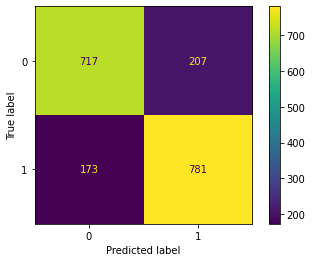



              precision    recall  f1-score   support

           0       0.81      0.78      0.79       924
           1       0.79      0.82      0.80       954

    accuracy                           0.80      1878
   macro avg       0.80      0.80      0.80      1878
weighted avg       0.80      0.80      0.80      1878



In [ ]:
#test = ' '.join([str(elem) for elem in texts_test])

test_pred = text_model.predict(texts_test2, yy_test)

test_pred.shape

test_pred=test_pred.reshape((test_pred.shape[0],))

test_pred=np.where(test_pred>0.5,1,0)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
cm = confusion_matrix(yy_test, test_pred, labels=text_model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=text_model.classes_)
disp.plot()
plt.show()
print('\n')

#Creating the classification report
print(classification_report(yy_test,test_pred))

# **LSTM Model**

Experiment to explore the alternative syntax to implement the neural networks offered by the library "Sequential"

In [ ]:
"""
train = ' '.join([str(elem) for elem in texts_train])
#texttostem = word_tokenize(texttostem)
#train = ' '.join([str(elem) for elem in texttostem])
train = train.split()

tfidf_vectorizer =  TfidfVectorizer(max_features = 50) #max_features = 2000

feature_vector = tfidf_vectorizer.fit(train)

features = feature_vector.get_feature_names_out()

train_ds_features = tfidf_vectorizer.transform(texts_train)
print(train_ds_features.shape)

model = Sequential()
model.add(Embedding(vocab_size, 50, weights=[embedding_matrix], input_length=50,trainable=False))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(64, activation='tanh', dropout=0.2, recurrent_dropout=0.2, return_sequences=True))
#model.add(BatchNormalization())
model.add(LSTM(64,activation='tanh', dropout=0.2, recurrent_dropout=0.2, return_sequences=False))
#model.add(BatchNormalization())
model.add(Dense(2))
model.add(Activation('softmax'))

model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=['accuracy'])
#print(train_ds_features)
y_train = to_categorical(yy_train)
model.fit(train_ds_features, y_train [0:7686] , epochs=3)
"""

'\ntrain = \' \'.join([str(elem) for elem in texts_train])\n#texttostem = word_tokenize(texttostem)\n#train = \' \'.join([str(elem) for elem in texttostem])\ntrain = train.split()\n\ntfidf_vectorizer =  TfidfVectorizer(max_features = 50) #max_features = 2000\n\nfeature_vector = tfidf_vectorizer.fit(train)\n\nfeatures = feature_vector.get_feature_names_out()\n\ntrain_ds_features = tfidf_vectorizer.transform(texts_train)\nprint(train_ds_features.shape)\n\nmodel = Sequential()\nmodel.add(Embedding(vocab_size, 50, weights=[embedding_matrix], input_length=50,trainable=False))\nmodel.add(SpatialDropout1D(0.2))\nmodel.add(LSTM(64, activation=\'tanh\', dropout=0.2, recurrent_dropout=0.2, return_sequences=True))\n#model.add(BatchNormalization())\nmodel.add(LSTM(64,activation=\'tanh\', dropout=0.2, recurrent_dropout=0.2, return_sequences=False))\n#model.add(BatchNormalization())\nmodel.add(Dense(2))\nmodel.add(Activation(\'softmax\'))\n\nmodel.compile(optimizer="adam", loss=\'categorical_crossen

# **Bi-LSTM MODEL**

Bi-directional long short term memory (Bi-LSTM) is a kind of LSTM model which has the ability to process the data in both forward and backward directions. Bi LSTM a sequence processing model consists of two LSTMs: one takes the input in forward direction, and the other in backwards direction. This model has shown to deliver better results according to accuracy, for which reason will be used in the explanation section as well.

In [ ]:
import keras
from sklearn.base import BaseEstimator, TransformerMixin #BaseEstimator just gives it the get_params and set_params methods that all Scikit-learn estimators
from keras.models import Model, Input, Sequential #Keras is used for creating deep models 
#Dense  layer is the regular deeply connected neural network layer.
#It is most common and frequently used layer.
#Dense layer does the below operation on the input and return the output.
#Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time and SpatialDropout1D is subversion
#Embedding layer enables us to convert each word into a fixed length vector of defined size
#Layer that concatenates a list of inputs
#Flatten is used to flatten the input
from keras.layers import Dense, Embedding, Bidirectional, concatenate, Flatten
from keras.layers import LSTM , Dropout , SpatialDropout1D
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.utils.vis_utils import plot_model #Converts a Keras model to dot format and save to a file
from keras.preprocessing.text import Tokenizer # The Tokenizer class of Keras is used for vectorizing a text corpus
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score
import regex as re
import numpy as np
from keras.utils.np_utils import to_categorical
from sklearn.utils import class_weight
from keras.callbacks import History

class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(yy_train), y=yy_train)
vocab_size = len(tokenizer.word_index) + 1

# Wrapper class from keras text-classification models that takes raw text as input.
class KerasTextClassifier(BaseEstimator, TransformerMixin):    
    
    def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=2, epochs=5, batch_size=32, validation_data = (texts_test, yy_test), class_weight=class_weights):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")
        self.validation_data = (texts_test, yy_test)
        
        #self.class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(yy_train), y=yy_train)
        #self.class_weights_dict = dict(zip(self.label_encoder.transform(list(self.label_encoder.classes_)), self.class_weights))
    # input_shape=(100,20,50), 
    def _get_model(self):
        input_text = Input(self.input_length)
        #print(input_text)
        text_embedding = Embedding(input_dim=self.max_words +2, output_dim=self.emb_dim,
                                   input_length=self.input_length, mask_zero=False)(input_text)
        #print(text_embedding)

        #text_embedding = SpatialDropout1D(0.2)(text_embedding)
        #text_embedding = Embedding(vocab_size, 50, weights=[embedding_matrix], input_length=100,trainable=False)(input_text)
        #print(text_embedding)

        text_embedding = SpatialDropout1D(0.2)(text_embedding)
        bilstm = Bidirectional(LSTM(units=32,dropout=0.2, recurrent_dropout=0.2, activation='tanh'))(text_embedding)
        flatten_layer = Flatten()
        x= flatten_layer(bilstm)
        # Dense layer with "ReLU" activation
        x = Dense(512, activation="relu")(x)
        # Dropout layer
        x = Dropout(0.2)(x)
        # Dense layer with "Softmax" activation
        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)

        # Specifying the training configurations (optimizer, loss function, accuracy metrics)
        model.compile(optimizer="adam", # Optimizer
                      # Loss function to minimize
                      loss="categorical_crossentropy", 
                      # Accuracy Metrics to monitor
                      metrics=["accuracy"])
        plot_model(model, to_file='model_plot.png',show_shapes=True, show_layer_names=True)
        return model
    
    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)
    
    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]
    
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.
        
        :params:
        X: list of texts.
        y: labels.
        '''
        
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
        
    
    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)
    
    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)
    
    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)
    
    def transform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)
        
    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))
        
    def summary(self):
       return self.model.summary()

text_model2 = KerasTextClassifier(epochs=3, max_words=20000, class_weight=class_weights, validation_data=(texts_test, yy_test), batch_size=10)
#train = text_model2.transform(texts_train)

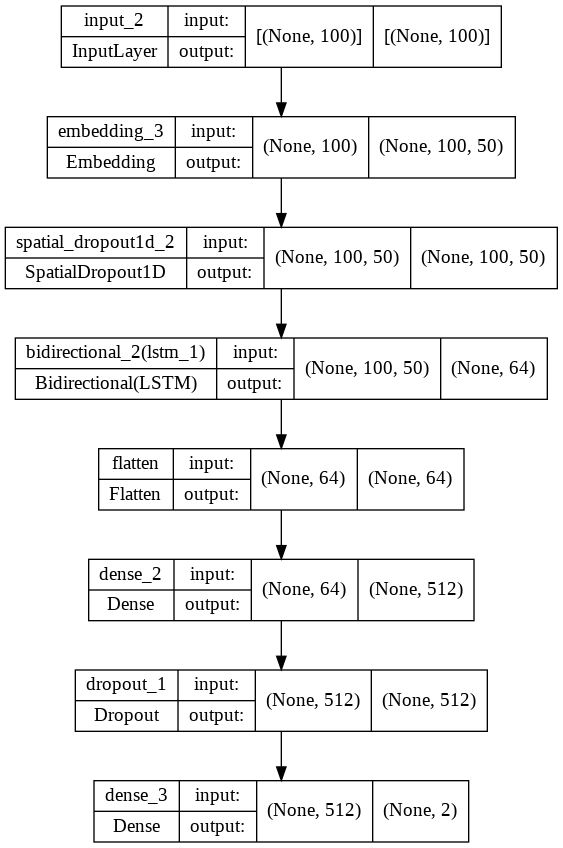

In [ ]:
from IPython.display import Image
Image(filename='model_plot.png')

Hereby we fit the model to our dataset

In [ ]:
y_train = to_categorical(yy_train)
history = text_model2.fit(texts_train, y_train)

Epoch 1/3
681/681 [==============================] - 551s 802ms/step - loss: 0.5368 - accuracy: 0.7201 - val_loss: 0.4549 - val_accuracy: 0.8042
Epoch 2/3
681/681 [==============================] - 549s 806ms/step - loss: 0.2751 - accuracy: 0.8908 - val_loss: 0.6626 - val_accuracy: 0.7804
Epoch 3/3
681/681 [==============================] - 534s 785ms/step - loss: 0.1466 - accuracy: 0.9446 - val_loss: 0.7038 - val_accuracy: 0.7817


In [ ]:
#test = ' '.join([str(elem) for elem in x_test])#[0:1884] #d_test['content']
text_model2.score(texts_test2, yy_test)


0.9616613418530351

The confusion matrix, as for the previous models, gives us a precise and intuitive visualization of the fitness accuracy

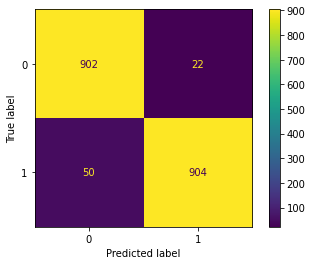



              precision    recall  f1-score   support

           0       0.95      0.98      0.96       924
           1       0.98      0.95      0.96       954

    accuracy                           0.96      1878
   macro avg       0.96      0.96      0.96      1878
weighted avg       0.96      0.96      0.96      1878



In [ ]:
test_pred = text_model2.predict(texts_test2, yy_test)

test_pred.shape

test_pred=test_pred.reshape((test_pred.shape[0],))

test_pred=np.where(test_pred>0.5,1,0)

#Creating the confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
cm = confusion_matrix(yy_test, test_pred, labels=text_model2.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=text_model2.classes_)
disp.plot()
plt.show()
print('\n')

# Classification Report
print(classification_report(yy_test,test_pred))

# **Loss- and accuracy curves visualization**

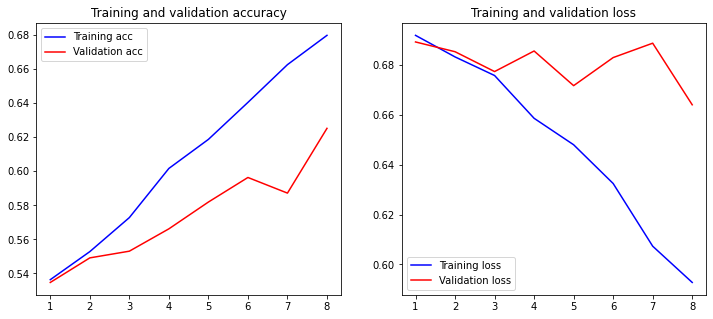

In [ ]:
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

plot_history(history)

In the following section the explanation methods SHAP, LIME and ELI5 are used. 

## **Explaining with SHAP Explaination (kernel Explaination)**


SHAP is a viable library which helps to make pretty visualizations of simple numeric measures to see which features mattered to a model. This helps to make comparisons between features easily, and one can present the resulting graphs to non-technical audiences to explain the internal mechanism of the black box models.

In [ ]:
encoded_x_train = text_model2.transform(texts_train)
encoded_x_test = text_model2.transform(texts_test2)

In [ ]:
# Generate the description of Integer numbers i.e 50 to Fifty
def prepare_explanation_words(pipeline, encoded_x):
    words = pipeline.tokenizer.word_index  #here is the mistake
    num2word = {}
    for w in words.keys():
        num2word[words[w]] = w
    x_test_words = np.stack([
        np.array(list(map(
            lambda x: num2word.get(x, "NONE"), encoded_x[i])
                     )) for i in range(10)])

    return x_test_words

In [ ]:
import shap

# Initialize SHAP Js to display explaination visualizations
shap.initjs()

# Defining the SHAP explainer
kernel_explainer = shap.KernelExplainer(text_model2.model.predict, encoded_x_train[:10])

# Explain the sentiments of the pipeline on the first 10 samples
kernel_shap_values = kernel_explainer.shap_values(encoded_x_test[:10])

x_test_words = prepare_explanation_words(text_model2, encoded_x_test)
y_pred = text_model2.predict(texts_test[:10])

  0%|          | 0/10 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

SHAP Explanation visualization for different dataset rows

In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (y_test[6], y_pred[6]))

# Display explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][6], x_test_words[6])

Actual Category: 0, Predict Category: 0


In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[9], y_pred[9]))

# Display explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 1, Predict Category: 0


In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[8], y_pred[8]))

# Display explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1, Predict Category: 0


In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()

# Display interactive explanation visualization
shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][:1000:,], x_test_words[6])

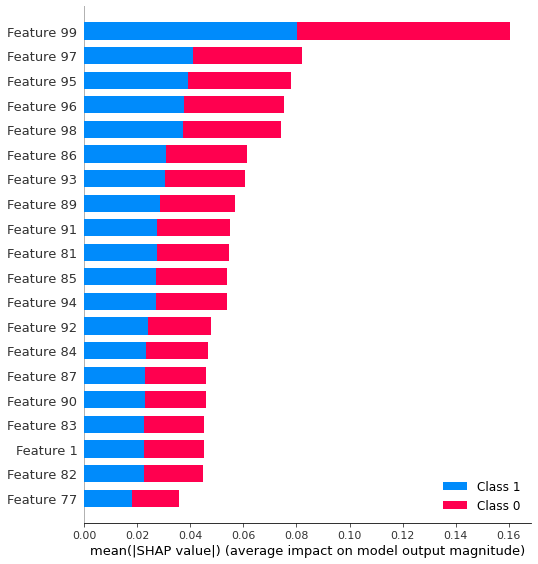

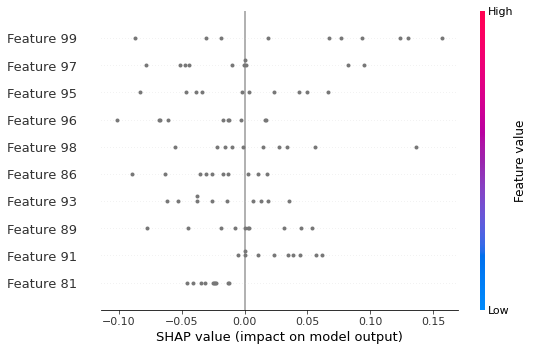

In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()

# Display SHAP Summary Plots to highlight feature importance
shap.summary_plot(kernel_shap_values,features=x_test_words )
shap.summary_plot(kernel_shap_values[1],features=x_test_words ,max_display=10 )

SHAP summary plots give us a birds-eye view of feature importance and what is driving it. The above shown plot is made of many dots. Each dot has three characteristics:


*   Vertical location shows what feature it is depicting
*   Color shows whether that feature was high or low for that row of the dataset
*   Horizontal location shows whether the effect of that value caused a higher or lower prediction

In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[9], y_pred[9]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][9], x_test_words[9])

Actual Category: 1, Predict Category: 0


In [ ]:
# Initialize SHAP Js to display explaination visualizations
shap.initjs()
print('Actual Category: %s, Predict Category: %s' % (yy_test[8], y_pred[8]))

shap.force_plot(kernel_explainer.expected_value[0], kernel_shap_values[0][8], x_test_words[8])

Actual Category: 1, Predict Category: 0


### **Explain the Visualization** 

*   This force plot of Kernel Explanation explains how different features pushed and pulled on the output to move it from the base_value to the model output value or prediction. The prediction of this kernel explanation is the probability or confidence that the review is 100% belong to predicted category  ("Negative" Class).


##**Explaining with Lime**

Sample 6: last 80 words (only part used by the model)
--------------------------------------------------
Luckily, I didn't have to travel far to make my connecting flight. And for this, I thank you, Phoenix. My brief layover was pleasant as the employees were kind and the flight was on time. Hopefully, next time I can grace Phoenix with my presence for a little while longer.
--------------------------------------------------
Probability(positive) = 0.3271397
True class:  0


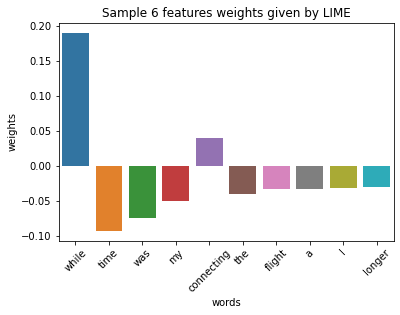

In [ ]:
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine() #removes the spines from the right and upper portion in plot
# We choose a sample from test set
#text sample from test set
idx =6
idx2 =9
idx3=15
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['Negative', 'Positive']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model2.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx]) #print in actual classes

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model2.predict_proba, num_features=10) #Passing sample text and prediction and feature to LIME explainer 

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
explanation.show_in_notebook(text=True)

Sample 9: last 80 words (only part used by the model)
--------------------------------------------------
Luckily, I didn't have to travel far to make my connecting flight. And for this, I thank you, Phoenix. My brief layover was pleasant as the employees were kind and the flight was on time. Hopefully, next time I can grace Phoenix with my presence for a little while longer.
--------------------------------------------------
Probability(positive) = 0.3271397
True class:  1


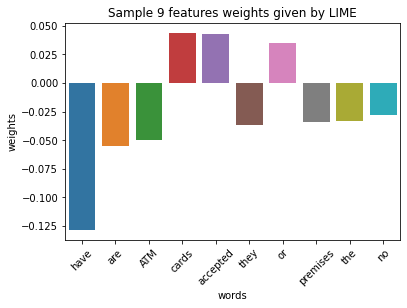

In [ ]:
#applying sample idx2
print('Sample {}: last 80 words (only part used by the model)'.format(idx2))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model2.predict_proba([text_sample])[0,1])
print("True class: ",yy_test[idx2])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample2, text_model2.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx2));

In [ ]:
explanation.show_in_notebook(text=True)

Sample 15: last 80 words (only part used by the model)
--------------------------------------------------
Luckily, I didn't have to travel far to make my connecting flight. And for this, I thank you, Phoenix. My brief layover was pleasant as the employees were kind and the flight was on time. Hopefully, next time I can grace Phoenix with my presence for a little while longer.
--------------------------------------------------
Probability(positive) = 0.3271397
True class:  0


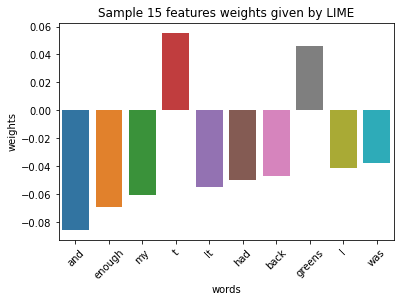

In [ ]:
#Applying the sample text idx3
print('Sample {}: last 80 words (only part used by the model)'.format(idx3))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
print('Probability(positive) =', text_model2.predict_proba([text_sample])[0,1])
print("True class: ",yy_test[idx3])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample3, text_model2.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})



sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx3));

In [ ]:
explanation.show_in_notebook(text=True)

### **Explain the Visualization** 


*   On the "Text with higligted words", the blue words made the classifier think that the review was more negative while the yellow words made the review seem more positive.

*   The explainer predicts that this review should be labeled as "positive" with the probability of above 90%.


With LIME methods of explanation, it is easy for Human to intrepret and understand the prediction. LIME allows us to extract some important word that mostly contribute to the prediction, and even give the rational number "Negative" or "Positive" contribution of each word of sample.

# **ELI5 explainable model**

ELI5 (Explain Like I’m 5) was created in July 2011. ELI5 is becoming popular and being used in academia and other people who want to explain complex concepts in layman’s terms. It highlights the strength of the ELI5 to help others understand the difficult and complex scenarios or processes in simple ways.

Nowadays, an abundance of deep learning models are being developed to solve complex problems in almost all fields of life. However, it is difficult to understand the internal mechanism of the deep learning models due their high complexity and black-box nature. In order to understand and debug deep learning models, ELI5 a Python package was developed which provides the ability to understand the internal mechanism of the ML models [3]. It can be used to visualize the various parameters of a model as well as to exploit or understand the individual predictions of a model based on the significance of different features. It provides a convenient way to debug the decisions made by the model.

ELI5 is capable of providing both local model interpretations and global model interpretations. The global model interpretations can be considered as feature importance. ELI5 not only supports decision tree algorithms (XGBoost, Random Forest) but also supports all sci-kit learn estimators.

ELI5 introduced permutation importance for the global interpretations. In order to calculate the score, a feature or a word is replaced with another feature or word while making predictions. The main concept is to investigate the feature importance by looking how much it decreases or increases in the absence of a specific word. For the local model interpretations, ELI5 depends on the LIME algorithm. However, the format of display is different from the LIME but the idea is the same.

In [ ]:
from eli5.lime import TextExplainer
doc = texts_test[6]
te = TextExplainer(random_state=42)
te.fit(doc, text_model2.predict_proba)
te.show_prediction(target_names=yy_train.all())

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.


The above shown ELI5 based explanation visualization highlights the positive sentiment words with green and negative sentiment words with red colors.  It can be seen that the overall sum of the negative words is “5.607” or 56.07% as this review is classified as a negative sentiment review.

# **Metrics**

### Faithfullness Metrics for LIME

In [ ]:
def lime_faithfulness_metric(model, x, coefs):
  pred_class = np.argmax(model.predict_proba(x), axis=1)[0]

  len_ = len(set(x.split()))

  tokens = list(dict.fromkeys(list(x.split())))
  pred_probs = np.zeros(len_)

  for i in range(len(tokens)):
    word = tokens[i]
    updated_str = x.replace(word, "")
    
    x_copy_pr = model.predict_proba([updated_str])
    pred_probs[i] = x_copy_pr[0][pred_class]
    if(len(pred_probs > len(coefs))):
        dif = len(pred_probs) - len(coefs)
        z = np.copy(coefs)
        for i in range(dif):
          z = np.append(z, 0.0)
    elif(len(pred_probs < len(coefs))):
        dif = len(coefs) - len(pred_probs)
        z = np.copy(pred_probs)
        for i in range(dif):
          z = np.append(z, 0.0)
  if(len(pred_probs > len(coefs)) or len(pred_probs < len(coefs))):
      return -np.corrcoef(z, pred_probs)[0,1]
  else:
      return -np.corrcoef(coefs, pred_probs)[0,1]

In [ ]:
num_iterations = 2 # Length of test dataset
faithfullness_score = []

for i in range(num_iterations):
    try:
      len_=len(set(texts_test[i].split()))
      exp = explainer.explain_instance(texts_test[i], text_model2.predict_proba, num_features=len_, labels=[0,1])
      predicted_class = np.argmax(text_model2.predict_proba([texts_test[i]]), axis=1)[0]
      local_exp = exp.local_exp[predicted_class]
      coefs = np.zeros(len(local_exp))

      for val in local_exp:
          coefs[val[0]] = val[1]
      
      score = lime_faithfulness_metric(text_model2, texts_test[i], coefs)
      faithfullness_score.append(score)
    except Exception:
        print('Error: ', i)
    
print("LIME Faithfulness Metric Mean: ",np.mean(faithfullness_score))
print("LIME Faithfulness Metric Standard Deviation Deviation:", np.std(faithfullness_score))

LIME Faithfulness Metric Mean:  0.06909735746266253
LIME Faithfulness Metric Standard Deviation Deviation: 0.09507998077428172


### Faithfullness Metrics for SHAP

In [ ]:
def shap_faithfullness_metric(model, text_str, text_words, coefs):
  
  #get predicted class by the model
  pred_class = np.argmax(model.predict_proba([' '.join(text_words)]), axis=1)[0]
  
  pred_probs = np.zeros(len(list(text_words)))

  #remove words one by one
  for i in range(len(list(text_words))-1):
    word = text_words[i]
    new_str = re.sub(r"\b(%s)\b" % "".join(word), "", text_str)
    x_copy_pr = model.predict_proba(new_str)
    pred_probs[i] = x_copy_pr[0][pred_class]

  return np.corrcoef(coefs, pred_probs)[0,1]

num_iterations = 2  #number of instances to check (# Length of test dataset)
faithfullness_score = []

for idx in range(num_iterations):
    score = shap_faithfullness_metric(text_model2, texts_test[idx], x_test_words[idx], kernel_shap_values[0][idx])
    faithfullness_score.append(score)
    
faithfullness_score_percentage = [i * 100 for i in faithfullness_score]
print("SHAP Faithfulness Metric Mean: ",np.mean(faithfullness_score_percentage))
print("SHAP Faithfulness Metric Standard Deviation:", np.std(faithfullness_score))

KeyboardInterrupt: ignored